In [0]:
from pyspark.sql.types import *
import pyspark
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

spark = SparkSession.builder.getOrCreate()

In [0]:
df_posts_skills = spark.read.option("inferSchema", "true").parquet("dbfs:/FileStore/shared_uploads/kinani@campus.technion.ac.il/df_position_skills_filtered.parquet")

# Using BERT to get the embeddings for skills for each post and for each position in this post

We merge the skills as one string and we got the embedding of this string

In [0]:
import ast
from pyspark.sql.types import MapType, LongType, StructType, StructField, StringType, ArrayType
from pyspark.sql.functions import explode, col, size, lower
from pyspark.sql.functions import udf

def extract_dict(dict_str):
    try:
        return ast.literal_eval(dict_str)
    except (SyntaxError, ValueError):
        dict_ = {}
        return dict_

def get_skills(skills_list):
    str_skill = skills_list[0]+', '
    for i in range(1,len(skills_list)):
        str_skill = str_skill + skills_list[i] + ', '
    return str_skill

extract_dict_udf = udf(extract_dict, MapType(StringType(), ArrayType(StringType())))
df_with_skills = df_posts_skills.withColumn("position_skills", extract_dict_udf(col('position_skills')))

b = df_with_skills.select('Title', 'post_link', 'position_skills')
df_exploded = b.select("*", explode(col("position_skills")).alias("postion", "skillList"))
df_exploded = df_exploded.where(size(col("skillList"))==7)
df_final = df_exploded.withColumn("skill", udf(get_skills)(col("skillList"))).drop("skillList")
df_final.display()

Title,post_link,position_skills,postion,skill
Home Care job available,https://www.linkedin.com/pulse/home-care-job-available-lizbeth-zielinski?trk=public_profile_article_view,"Map(Home Care Scheduler -> List(Scheduling, Communication, Time Management, Problem Solving, Customer Service, Flexibility, Compassion))",Home Care Scheduler,"Scheduling, Communication, Time Management, Problem Solving, Customer Service, Flexibility, Compassion,"
Customer Service 5 to 10 positions available,https://www.linkedin.com/pulse/customer-service-5-10-positions-available-stephanie-litchfield?trk=public_profile_article_view,"Map(Entry Level and Experienced In-Store Customer Service / Sales Representatives -> List(Customer Service, Sales, Communication, Teamwork, Problem-Solving, Active Listening, Product Knowledge))",Entry Level and Experienced In-Store Customer Service / Sales Representatives,"Customer Service, Sales, Communication, Teamwork, Problem-Solving, Active Listening, Product Knowledge,"
JOB ALERT,https://www.linkedin.com/pulse/job-alert-susan-portugal?trk=public_profile_article_view,"Map(Executive Director -> List(Strategic Planning, Leadership, Fundraising, Communication, Relationship-Building, Visionary Thinking, Innovation))",Executive Director,"Strategic Planning, Leadership, Fundraising, Communication, Relationship-Building, Visionary Thinking, Innovation,"
GREAT CSR JOB IN LONDON!,https://www.linkedin.com/pulse/great-csr-job-london-susan-portugal?trk=public_profile_article_view,"Map(Employee Engagement Manager - EMEABank of America Merrill Lynch - London -> List(Employee Engagement, Change Management, Strategic Planning, Communication, Stakeholder Management, Organizational Development, Performance Management))",Employee Engagement Manager - EMEABank of America Merrill Lynch - London,"Employee Engagement, Change Management, Strategic Planning, Communication, Stakeholder Management, Organizational Development, Performance Management,"
Wonderful Job Opportunity At Points of Light,https://www.linkedin.com/pulse/wonderful-job-opportunity-points-light-susan-portugal?trk=public_profile_article_view,"Map(Manager, Economic Opportunity Programs -> List(Program Management, Budget Analysis, Community Outreach, Case Management, Data Collection and Analysis, Grant Writing, Fund Development))","Manager, Economic Opportunity Programs","Program Management, Budget Analysis, Community Outreach, Case Management, Data Collection and Analysis, Grant Writing, Fund Development,"
We are hiring...,https://www.linkedin.com/pulse/we-hiring-tiffany-taylor?trk=public_profile_article_view,"Map(Maintenance Technician -> List(Troubleshooting, Repair and maintenance, Mechanical aptitude, Electrical knowledge, Plumbing skills, HVAC knowledge, Customer service))",Maintenance Technician,"Troubleshooting, Repair and maintenance, Mechanical aptitude, Electrical knowledge, Plumbing skills, HVAC knowledge, Customer service,"
Job Posting: Omadi - Senior Implementation Engineer,https://www.linkedin.com/pulse/job-posting-omadi-senior-implementation-engineer-daniel-marsh?trk=public_profile_article_view,"Map(Senior Implementation Engineer -> List(Cloud Computing, System Integration, Data Management, Networking, Security, Project Management, Communication))",Senior Implementation Engineer,"Cloud Computing, System Integration, Data Management, Networking, Security, Project Management, Communication,"
Marcotte is hiring a Group Benefits Department Manager.,https://www.linkedin.com/pulse/marcotte-hiring-group-benefits-department-manager-trish-maynard?trk=public_profile_article_view,"Map(Group Benefits Department Manager -> List(Employee Benefits Management, HR Management, Budgeting, Vendor Management, Compliance, Communication, Problem-Solving))",Group Benefits Department Manager,"Employee Benefits Management, HR Management, Budgeting, Vendor Management, Compliance, Communication, Problem-Solving,"
Marcotte is hiring Group Benefits Department Manager position.,https://www.linked

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml import Pipeline
from pyspark.sql.functions import collect_list
from sparknlp.annotator import Tokenizer, BertSentenceEmbeddings
from sparknlp.base import DocumentAssembler
from pyspark.sql.functions import col

# Sample DataFrame (df_final) assumed to be defined

document_assembler = DocumentAssembler().setInputCol("skill").setOutputCol("document")

# Tokenizer to tokenize the "skill" column
tokenizer = Tokenizer().setInputCols(["document"]).setOutputCol("tokenized_skill")

# Define a BertEmbeddings annotator
bert_embeddings = BertSentenceEmbeddings.pretrained("sent_small_bert_L12_256", "en") \
    .setInputCols(["document"]).setOutputCol("bert_embeddings")

# Define the pipeline
pipeline = Pipeline(stages=[document_assembler, tokenizer, bert_embeddings])

# Fit the pipeline to the data
model = pipeline.fit(df_final)

# Transform the data to obtain BERT embeddings for each skill
result = model.transform(df_final)

titles = [id[0] for id in result.select("Title").collect()]
post_link = [position[0] for position in result.select("post_link").collect()]
positions = [position[0] for position in result.select("postion").collect()]
embeddings = [embeddings[0][0]['embeddings'] for embeddings in result.select("bert_embeddings").collect()]

data = list(zip(titles, post_link, positions, embeddings))
result = spark.createDataFrame(data, schema=['Title', 'post_link', 'position','embeddings'])
# result.display()

sent_small_bert_L12_256 download started this may take some time.
Approximate size to download 63.2 MB
[OK!]


#Applying the PCA on the positions embeddings
we want to see if we can see obvious clusters to lead us in chosing the K in the Kmeans

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StandardScaler
from pyspark.ml.feature import PCA
from pyspark.sql import SparkSession
from pyspark.ml.linalg import VectorUDT
from pyspark.ml.linalg import Vectors

dense_vector_udf = udf(lambda x: Vectors.dense(x), VectorUDT())

# Apply the UDF to convert 'embedding' arrays into DenseVectors
data = result.withColumn("embedding_dense", dense_vector_udf("embeddings"))
# Assemble flattened features into a single vector column
assembler = VectorAssembler(inputCols=["embedding_dense"], outputCol="features1")
data = assembler.transform(data)

# Standardize features
scaler = StandardScaler(inputCol="features1", outputCol="scaledFeatures1", withStd=True, withMean=True)
scalerModel = scaler.fit(data)
data = scalerModel.transform(data)

# Perform PCA
pca = PCA(k=2, inputCol="scaledFeatures1", outputCol="pcaFeatures")
model = pca.fit(data)
data = model.transform(data)

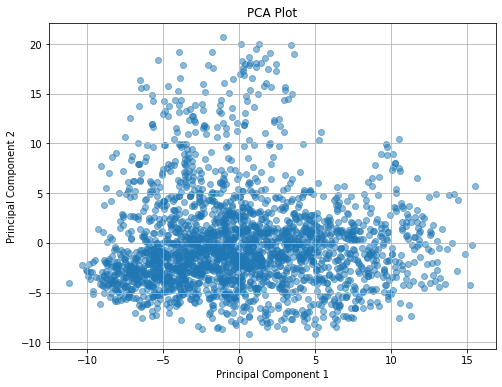

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.sql import SparkSession

pca_data = data.select("pcaFeatures").rdd.map(lambda row: row.pcaFeatures.toArray()).collect()

# Convert the PCA data to a pandas DataFrame
pca_df = pd.DataFrame(pca_data, columns=['PC1', 'PC2'])  # Adjust column names as per 

# Plot the PCA data
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.title('PCA Plot')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()



In [0]:
explained_variance = model.explainedVariance.toArray()

# Calculate the percentage of explained variance
total_variance = sum(explained_variance)
explained_variance_percentage = [(ev / total_variance) * 100 for ev in explained_variance]
for i, evp in enumerate(explained_variance_percentage):
    print(f"Principal Component {i+1}: {evp:.2f}%")

Principal Component 1: 52.77%
Principal Component 2: 47.23%


#bar plot on the job positions to know how many clusters we we can do


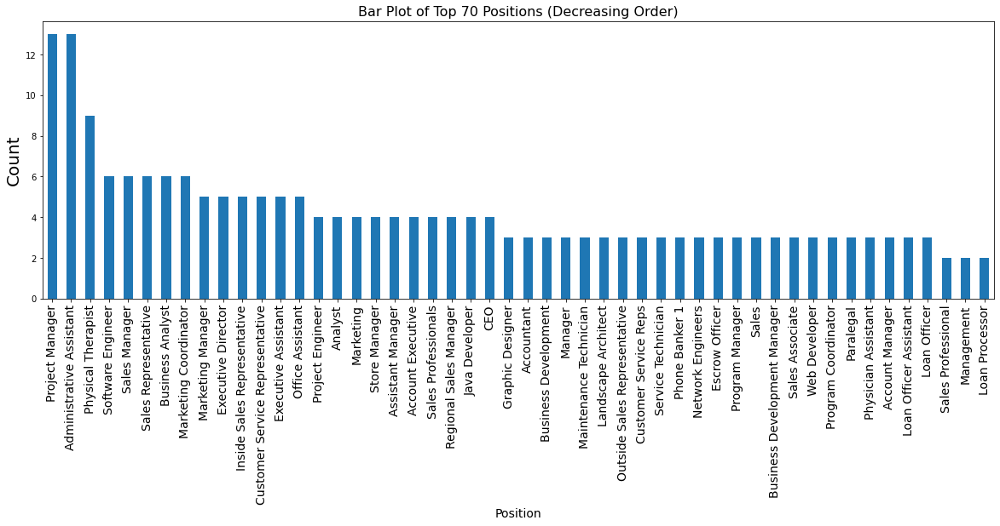

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame df with your big data

# Aggregate data to get counts for each position
df_pd = result.select('position').toPandas()

# Aggregate data to get counts for each position
position_counts = df_pd['position'].value_counts()

# Sort positions by count in decreasing order
position_counts_sorted = position_counts.sort_values(ascending=False)

# Select the top 50 positions
position_counts_top50 = position_counts_sorted.head(50)

# Plot the bar plot
plt.figure(figsize=(20, 6))  # Adjust figure size as needed
position_counts_top50.plot(kind='bar')

# Set title and labels with increased font size
plt.title('Bar Plot of Top 70 Positions (Decreasing Order)', fontsize=16)
plt.xlabel('Position', fontsize=14)
plt.ylabel('Count', fontsize=20)

# Increase font size of x-axis tick labels
plt.xticks(fontsize=14)

plt.show()


# Applying Kmean on the embeddings of the skills, so we can cluster posts that are similar.

In [0]:
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.clustering import KMeans
from pyspark.sql.types import DoubleType
from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.sql.functions import udf
"""
using kmeans to classify similar positions in the same cluster
"""
convert_to_vector = udf(lambda x: Vectors.dense(x), VectorUDT())
df_embeddings = result.withColumn('embedding', convert_to_vector('embeddings'))

assembler = VectorAssembler(inputCols=["embedding"], outputCol="features")
data = assembler.transform(df_embeddings)

kmeans = KMeans(featuresCol="features", k=50, seed=42)
model = kmeans.fit(data)

predictions = model.transform(data)

In [0]:
v = predictions.select("Title", "post_link", "position", "embeddings", "prediction")
# v.display()

In [0]:
model_path = "dbfs:/FileStore/shared_uploads/kinani@campus.technion.ac.il/kmeans_model"
model.write().overwrite().save(model_path)

# Part that we could use if we have more powerful machines (we assume that it will give us better performance, as you will see in the report)

In [0]:
import ast
from pyspark.sql.types import MapType, LongType, StructType, StructField, StringType, ArrayType
from pyspark.sql.functions import explode, col, size, lower

def extract_dict(dict_str):
    try:
        return ast.literal_eval(dict_str)
    except (SyntaxError, ValueError):
        dict_ = {}
        return dict_
      
extract_dict_udf = udf(extract_dict, MapType(StringType(), ArrayType(StringType())))
df_with_skills = df_posts_skills.withColumn("position_skills", extract_dict_udf(col('position_skills')))

b = df_with_skills.select('Title', 'post_link', 'position_skills')

df_exploded = b.select("*", explode(col("position_skills")).alias("postion", "skillList"))
df_exploded = df_exploded.where(size(col("skillList"))==7)
df_final = df_exploded.withColumn("skill", explode(col("skillList"))).drop("skills", "skillList")
df_final = df_final.withColumn("skill", lower(col('skill')))

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml import Pipeline
from pyspark.sql.functions import collect_list
from sparknlp.annotator import Tokenizer, BertSentenceEmbeddings
from sparknlp.base import DocumentAssembler
from pyspark.sql.functions import col

# Sample DataFrame (df_final) assumed to be defined

document_assembler = DocumentAssembler().setInputCol("skill").setOutputCol("document")

# Tokenizer to tokenize the "skill" column
tokenizer = Tokenizer().setInputCols(["document"]).setOutputCol("tokenized_skill")

# Define a BertEmbeddings annotator
bert_embeddings = BertSentenceEmbeddings.pretrained("sent_small_bert_L12_256", "en") \
    .setInputCols(["document"]).setOutputCol("bert_embeddings")

# Define the pipeline
pipeline = Pipeline(stages=[document_assembler, tokenizer, bert_embeddings])

# Fit the pipeline to the data
model = pipeline.fit(df_final)

# Transform the data to obtain BERT embeddings for each skill
result = model.transform(df_final)

titles = [id[0] for id in result.select("Title").collect()]
post_link = [position[0] for position in result.select("post_link").collect()]
positions = [position[0] for position in result.select("postion").collect()]
embeddings = [embeddings[0][0]['embeddings'] for embeddings in result.select("bert_embeddings").collect()]

data = list(zip(titles, post_link, positions, embeddings))
result = spark.createDataFrame(data, schema=['Title', 'post_link', 'position','embeddings'])

df_aggregated = result.groupBy("Title", "post_link", "position").agg(collect_list("embeddings").alias("embeddings"))
df_aggregated.display()

# Load Data

In [0]:
df_posts_skills_embeddings = spark.read.parquet("dbfs:/FileStore/shared_uploads/kinani@campus.technion.ac.il/posts_skills_embeddings-1.parquet")

# Applying PCA on the embeddings so we can work with them easily.

In [0]:
import ast
from pyspark.sql.types import MapType, LongType, StructType, StructField, StringType, ArrayType,DoubleType
from pyspark.sql.functions import explode, col, size

def extract_list(dict_str):
    try:
        return ast.literal_eval(dict_str)
    except (SyntaxError, ValueError):
        dict_ = []
        return dict_
      
extract_dict_udf = udf(extract_list, ArrayType(ArrayType(DoubleType())))
df_posts_skills = df_posts_skills_embeddings.withColumn('embeddings', extract_dict_udf(col('embeddings')))

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import PCA
from pyspark.sql.functions import explode, collect_list
from pyspark.ml.feature import VectorAssembler
from pyspark.sql.types import DoubleType
from pyspark.ml.linalg import Vectors, VectorUDT
from pyspark.sql.functions import udf

df_exploded = df_posts_skills.select('Title', 'post_link', 'position', explode('embeddings').alias("inner_list"))

convert_to_vector = udf(lambda x: Vectors.dense(x), VectorUDT())
df_exploded = df_exploded.withColumn('inner_list', convert_to_vector('inner_list'))

assembler = VectorAssembler(inputCols=["inner_list"], outputCol="assembled_features")
assembled_df = assembler.transform(df_exploded)

pca = PCA(k=36, inputCol="assembled_features", outputCol="pca_features")
model = pca.fit(assembled_df)

pca_result = model.transform(assembled_df)

titles = [id[0] for id in pca_result.select("Title").collect()]
post_link = [position[0] for position in pca_result.select("post_link").collect()]
positions = [position[0] for position in pca_result.select("position").collect()]
embeddings = [embeddings[0].toArray().tolist() for embeddings in pca_result.select("pca_features").collect()]

data = list(zip(titles, post_link, positions, embeddings))
result = spark.createDataFrame(data, schema=['Title', 'post_link', 'position','embeddings'])

df_aggregated = result.groupBy("Title", "post_link", "position").agg(collect_list("embeddings").alias("embeddings"))
df_aggregated.display()


Title post_link position embeddings "General Manger Position" Apply Now, or Refer Someone! https://www.linkedin.com/pulse/general-manger-position-apply-now-refer-someone-fade-kashkeesh?trk=public_profile_article_view General Manager List(List(-6.219434028878538, 0.8406007287626664, -1.0837186549517417, -2.8442916712969253, -6.118931950487228, 0.6827495518025413, 1.065441340425766, 0.37507515245186496, -2.152998763517522, -0.3610978857329782, 3.5894794851399454, 1.3856613091131273, 0.3751348954862247, 0.6739993376782175, 0.1098792871258169, 0.9035133824976717, 0.8960880499128943, 0.9148514419813913, 1.415229907790805, 1.6573752218501214, 1.3352087667447206, 0.5991152751835026, -0.4707899911614268, 0.4165732910590131, 0.3716550865196852, -1.4846819419864101, -0.30733384787556445, -0.4556428429495194, -0.47418241166210023, -0.8725732529679868, 0.09556454649726023, -0.960222423445841, 1.3263074454128572, 0.4380705149068607, -1.0175033256662014, -0.15723854549930963), List(-5.996338408065857, -1.1024868256188878, -3.7253434880407204, -6.516943612571281, -3.8783527457278355, -0.3610987819038317, 1.5399715308932158, 1.117299197445319, -0.3946556620369137, -1.1294450799877798, 1.0649515214243408, 1.1535207401808343, 0.8293267567987862, 0.5137616362392379, -0.2549945784334978, -0.9130062352517082, 1.3296305102023456, 0.20947524553627872, 0.626080643107363, 0.4218976206135848, 0.07630304260245734, -0.10219115831169391, 0.8108584086791012, 0.5618147922438405, 0.27086132608284597, -1.0818595170870693, -0.5016351037580913, -0.32637001714294406, -0.2921763555521236, -0.8253355279523851, -0.010121943975343238, -0.8793740507169834, 0.9647847101759975, 0.5277971255901818, -0.663069697046803, 0.29044317637724937), List(-0.8595968276219158, 0.38410129892832057, 0.8043381127145531, -1.1741787008818425, -4.6032807313302095, -0.862604981728096, 1.5185333532151806, 1.6133603408928539, 0.5391539662212042, -0.09029136989113268, 2.0492341190561745, 0.4844963947656712, -0.38854200279353496, 1.7465461867474135, 0.16186049687199344, -1.183669659124061, 2.4570625431879356, 1.0502812652265139, 1.560995661795712, -1.599153970736236, -1.3162131503705736, 1.5204340497971383, 1.4409806284197897, -0.06995219270862171, 0.537218745272203, -0.9033768380884649, 0.4391013332306884, -0.28782660329357934, 0.06160638660058498, -2.4152697885988874, -1.2187028286771229, -0.939863659975235, 0.5464810540318278, 0.7305373678472752, 0.3833412582886677, 0.7979383172998871), List(3.558530126097126, -2.0795380535430468, 1.566472131834259, -5.017086311824304, -3.981732395742336, -1.9967296868725735, 2.3347801623455315, -0.45334133700947443, -0.35852576867467373, -1.5060671415715505, 1.7675007492709405, 2.140861203813369, 0.16165298251749194, 0.785410607235153, 0.47987504239125844, -1.1958031995013625, 1.4270674166849409, 0.12971370350263497, 0.8873253432776036, 0.40230206160032167, 0.6920553922862688, -0.32072384058931747, 0.34984166633486363, 0.4066344741043178, 0.6270192367882905, -0.9269259153422809, -0.359936664212643, -0.4656787659245958, -0.24267451634797427, -0.8378193916980307, 0.22845842065478478, -0.6488470024542252, 0.9410472861464896, 0.5443492406869483, -0.7929421926530033, 0.2997645373350811), List(-2.253896292011247, 4.131941348539411, -1.3721611851076716, -3.937495885514383, -5.183026251775092, -1.6342751426413722, 0.7042259751290069, 1.5321949984291656, 2.0090915357933006, -1.9400899872446435, 0.9813394826856667, 0.41860540737707236, 0.842190837704066, 0.36410122594980954, 0.04351234487011919, -0.5352296575103683, 0.9097336910226541, 0.46389188258993064, 1.1708289953625906, 0.8816605216114751, 0.8915182624294565, 0.7331975065873126, 1.4032215684022826, 0.6690877695302134, 0.9482155016226547, -1.0424397528681428, -1.0799288197476449, -0.9930258121598543, 0.4453619128422145, -0.573914731017425, 0.17866017328725758, -0.3945089406238688, 1.4852892511513718, -0.11464446015777296, -1.1144150421225365, 0.20508307819563232), List(-0.94345156420647, 2.65611678182136, -1.9

# Applying Kmean on the embeddings of the skills (after PCA), so we can cluster posts that are similar.

In [0]:
def con_lists(L):
    l=[]
    for embed_list in L :
        l.extend(embed_list)
    return l 

X = df_aggregated.toPandas()
X = X['embeddings']
X = X.apply(con_lists)

In [0]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import numpy as np

np.random.seed(42)

def custom_distance(x1, x2):
    def find_most_similar_skill(skill, skills_list):
        sk_list = skills_list
        similarities = []
        for s in sk_list:
            similarity = cosine_similarity([skill], [s])[0][0]
            similarities.append(similarity)
        most_similar_skill = np.argmax(similarities)
        return most_similar_skill
    sk_list1 = [x1[i*36: (i+1)*36] for i in range(7)]
    sk_list2 = [x2[i*36: (i+1)*36] for i in range(7)]
    mapped_list2 = [find_most_similar_skill(skill, sk_list2) for skill in sk_list1]
    dist = 0
    for i in range(len(sk_list1)):
        dist += euclidean(sk_list1[i], sk_list2[mapped_list2[i]])
    return dist

def initialize_centers_plusplus(X, k):
    indices = np.random.choice(X.index, size=k, replace=False)
    centers = [X[idx] for idx in indices]
    return np.array(centers)

def assign_clusters(X, centers):
    assignments = []
    for x in X:
        distances = [custom_distance(x, center) for center in centers]
        assignment = np.argmin(distances)
        assignments.append(assignment)
    return assignments

def update_centers(X, assignments, k):
    new_centers = []
    for i in range(k):
        indices = np.where(np.array(assignments) == i)
        cluster_points = X.iloc[indices]
        if len(cluster_points) > 0:  # Avoid division by zero for empty clusters
            new_center = np.mean(np.array(cluster_points.tolist()), axis=0)
            new_centers.append(new_center)
        else:  # Handle empty cluster by reinitializing to a random point
            new_centers.append(X[np.random.randint(0, len(X))])
    return np.array(new_centers)

def k_means_plusplus(X, k, max_iters=100):
    if isinstance(X, list):  # Check if X is a list of lists
        X = np.array(X)  # Convert to NumPy array
    centers = initialize_centers_plusplus(X, k)
    for _ in range(max_iters):
        print(_)
        assignments = assign_clusters(X, centers)
        new_centers = update_centers(X, assignments, k)
        if np.allclose(centers, new_centers):
            break
        centers = new_centers
    return centers, assignments

centers, assignments = k_means_plusplus(X, 250)

0
1
2
3
4
5
6
7
8
9
10


In [0]:
x = [int(x) for x in assignments]

# Merge the predictions that we got from Kmean with the dataframe

In [0]:
titles = [id[0] for id in df_aggregated.select("Title").collect()]
post_link = [position[0] for position in df_aggregated.select("post_link").collect()]
positions = [position[0] for position in df_aggregated.select("position").collect()]

data = list(zip(titles, post_link, positions, x))

schema = StructType([
    StructField("Titles", StringType(), nullable=False),
    StructField("post_link", StringType(), nullable=False),
    StructField("position", StringType(), nullable=False),
    StructField("predictions", IntegerType(), nullable=False),
])
preds = spark.createDataFrame(data, schema=schema)
preds.display()

Titles,post_link,position,predictions
#JaneFillsJobs in #Cincinnati!,https://www.linkedin.com/pulse/janefillsjobs-cincinnati-jane-lankford?trk=public_profile_article_view,ETL Developer,194
BGI Retail is Holding a Job Fair!,https://www.linkedin.com/pulse/bgi-retail-holding-job-fair-manny-verbit?trk=public_profile_article_view,Assemblers,86
Bath and Body Works now Hiring Leadership Positions,https://www.linkedin.com/pulse/bath-body-works-now-hiring-leadership-positions-kristina-dedivanaj?trk=public_profile_article_view,assistant manager/Co-Manager,30
Buster Miles Chevrolet is in need of a transmission/diesel technician!,https://www.linkedin.com/pulse/buster-miles-chevrolet-need-transmissiondiesel-nona-morris?trk=public_profile_article_view,Certified Technician:,221
HIRING NOW,https://www.linkedin.com/pulse/hiring-now-amit-modi?trk=public_profile_article_view,"Senior Analyst, Analytics",113
Hiring a Healthcare Industry Adviser for 6-8 Week Contract Assignment,https://www.linkedin.com/pulse/hiring-healthcare-industry-adviser-6-8-week-contract-larry-rothchild?trk=public_profile_article_view,Healthcare Industry Adviser,161
Hiring a Healthcare Recruiter & Veteran Specialist Recruiter,https://www.linkedin.com/pulse/hiring-healthcare-recruiter-veteran-specialist-larry-rothchild?trk=public_profile_article_view,"Healthcare Recruiter, Veteran Specialist Recruiter",133
Job Vacancy: Working Internationally,https://www.linkedin.com/pulse/job-vacancy-working-internationally-linh-huynh?trk=public_profile_article_view,"Financial Controller, Cash Manager",62
"Open Positions: Columbia, MD for a Buyer Agent & Showing Assistant",https://www.linkedin.com/pulse/open-positions-columbia-md-buyer-agent-showing-chris-weymouth?trk=public_profile_article_view,Showing Assistant,170
Senior-level Channel role @HP,https://www.linkedin.com/pulse/senior-level-channel-role-hp-kirk-skinner?trk=public_profile_article_view,"World-Wide Services Segment Manager, Senior-level Channel role",144
